In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_palette('pastel')

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor

In [57]:
df=pd.read_csv('dataframe.csv',index_col=0)

In [58]:
df.head()

,id,host_is_superhost,host_has_profile_pic,host_identity_verified,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,...,room_type_Private room,room_type_Entire home/apt,bed_type_Real Bed,bed_type_Pull-out Sofa,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_strict_14_with_grace_period,description_type__1,description_type__2,description_type__3
0,2015,1.0,1.0,1.0,0,3,1.0,1.0,2.0,60.0,...,False,True,True,False,False,False,True,0,0,0
1,2695,0.0,1.0,1.0,1,2,1.0,1.0,1.0,17.0,...,True,False,True,False,True,False,False,0,0,0
2,3176,0.0,1.0,1.0,1,4,1.0,1.0,2.0,90.0,...,False,True,True,False,False,False,True,0,0,0
3,3309,0.0,1.0,1.0,1,2,1.0,1.0,1.0,26.0,...,True,False,False,True,False,False,True,0,0,1
5,9991,0.0,1.0,1.0,0,7,2.5,4.0,7.0,180.0,...,False,True,True,False,False,False,True,1,0,0


In [59]:
X=df.drop(['id','price'],axis=1)
y=df['price']

In [60]:
X_train,X_test,y_train,y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [61]:
# Random Forest Model

In [62]:
rtree_train_score=[]
rtree_test_score=[]
for i in range(2,20):
    rtree=RandomForestRegressor(n_estimators=40,max_depth=i) #adjust max_depth here. overfitting is a problem here.
    rtree.fit(X_train,y_train)
    rtree_train_score.append(rtree.score(X_train,y_train))
    rtree_test_score.append(rtree.score(X_test,y_test))

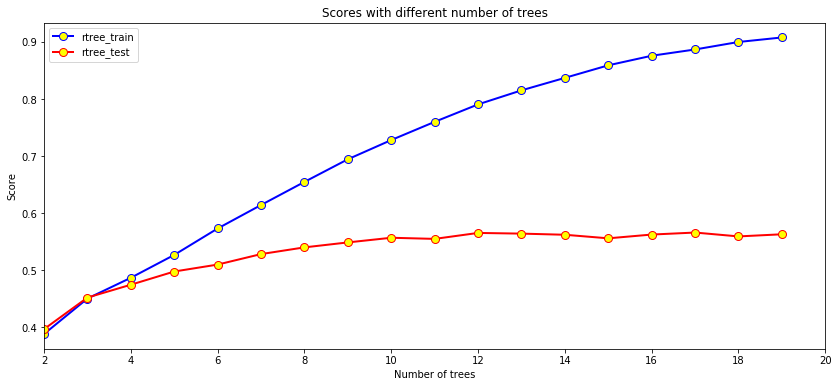

In [63]:
fig,ax = plt.subplots(figsize=(14,6)) #adjust figure size

ax.plot(range(2,20),rtree_train_score,label='rtree_train',color="blue", lw=2, ls='-', marker='o', markersize=8,markerfacecolor="yellow")
ax.plot(range(2,20),rtree_test_score,label='rtree_test',color="red", lw=2, ls='-', marker='o', markersize=8,markerfacecolor="yellow")

ax.set_xlim([2, 20]) #adjust limit here to zoom in
ax.set_xlabel('Number of trees')
ax.set_ylabel('Score')
ax.set_title('Scores with different number of trees')
ax.legend()

In [64]:
rtree16=RandomForestRegressor(n_estimators=40,max_depth=16)
rtree16.fit(X_train,y_train)
print(rtree16.score(X_train,y_train))
print(rtree16.score(X_test,y_test))

0.8751132889265155
0.5660208054412352


In [77]:
result_rtree16=pd.Series(rtree16.feature_importances_, index=X.columns)
result_rtree16[result_rtree16>0.02].sort_values(ascending=False).values

array([0.17824742, 0.14775165, 0.11578813, 0.04856436, 0.04096786,
       0.03674717, 0.03159362, 0.03157264, 0.03121671, 0.0311705 ,
       0.0303592 , 0.0290114 , 0.02488846, 0.02254509, 0.02226171,
       0.02095932, 0.02081182])

Text(0.5,0,'Feature Importance')

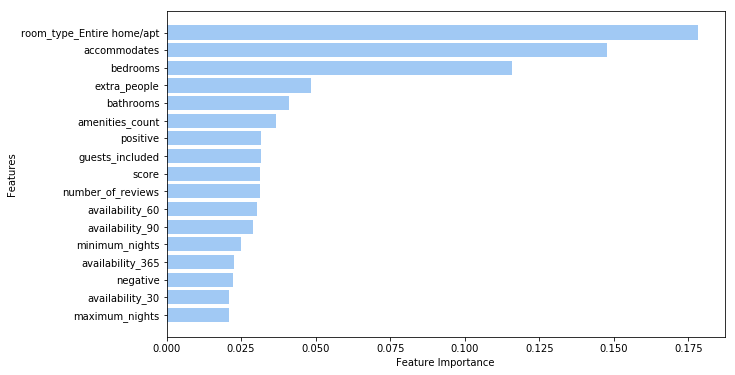

In [80]:
plt.figure(figsize=(10,6)) #adjust size to zoom in
plt.barh(np.arange(len(result_rtree16[result_rtree16>0.02])),result_rtree16[result_rtree16>0.02].sort_values().values)
plt.yticks(np.arange(len(result_rtree16[result_rtree16>0.02])), result_rtree16[result_rtree16>0.02].sort_values().index)
plt.ylabel('Features')
plt.xlabel('Feature Importance')

In [67]:
rtree5=RandomForestRegressor(n_estimators=40,max_depth=5)
rtree5.fit(X_train,y_train)
estimator = rtree5.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='rftree.dot', 
                feature_names = X.columns,
                class_names = y_train,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'rftree.dot', '-o', 'rftree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'rftree.png')

In [68]:
# Boosting Model

In [69]:
gbr_train_score=[]
gbr_test_score=[]
for i in range(10,401,10):
    gbr=GradientBoostingRegressor(loss='ls', learning_rate=0.1, n_estimators=i, min_samples_split=2, max_depth=5)
    gbr.fit(X_train,y_train)
    gbr_train_score.append(gbr.score(X_train,y_train))
    gbr_test_score.append(gbr.score(X_test,y_test))



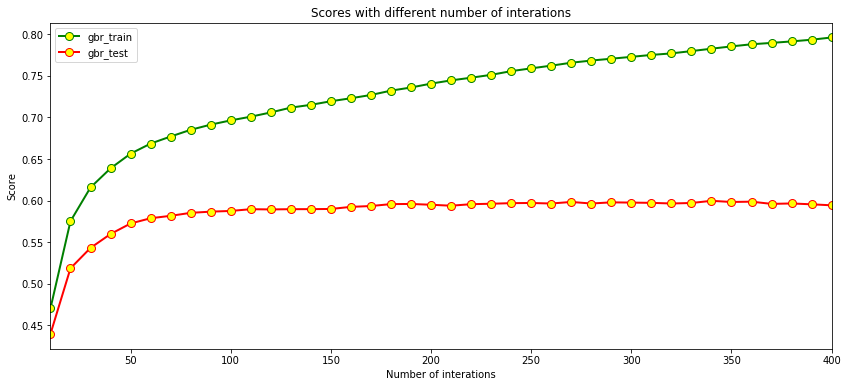

In [70]:
fig,ax = plt.subplots(figsize=(14,6)) #adjust figure size

ax.plot(range(10,401,10),gbr_train_score,label='gbr_train',color="g", lw=2, ls='-', marker='o', markersize=8,markerfacecolor="yellow")
ax.plot(range(10,401,10),gbr_test_score,label='gbr_test',color="red", lw=2, ls='-', marker='o', markersize=8,markerfacecolor="yellow")

ax.set_xlim([10, 400]) #adjust limit here to zoom in
ax.set_xlabel('Number of interations')
ax.set_ylabel('Score')
ax.set_title('Scores with different number of interations')
ax.legend()
import sys
sys.stdout.write('\a')
sys.stdout.flush()

In [71]:
gbr310=GradientBoostingRegressor(loss='ls', learning_rate=0.1, n_estimators=310, min_samples_split=2, max_depth=5)
gbr310.fit(X_train,y_train)
print(gbr310.score(X_train,y_train))
print(gbr310.score(X_test,y_test))

0.7752761619584004
0.5977809208281657


In [81]:
result_gbr310=pd.Series(gbr310.feature_importances_, index=X.columns)
result_gbr310[result_gbr310>0.01].sort_values(ascending=False).values

array([0.0810449 , 0.06441126, 0.06409629, 0.05932813, 0.05164461,
       0.05148517, 0.05105495, 0.04837149, 0.04314879, 0.04043595,
       0.03760938, 0.03637169, 0.03557359, 0.03273306, 0.02967119,
       0.02552728, 0.0253878 , 0.0223493 , 0.01637956, 0.01174818,
       0.01129148, 0.01108748, 0.01079799])

Text(0.5,0,'Feature Importance')

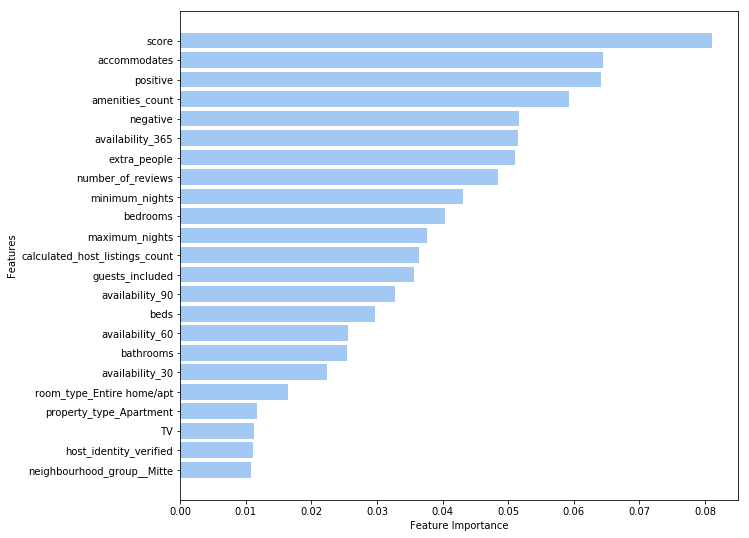

In [84]:
plt.figure(figsize=(10,9)) #adjust size to zoom in
plt.barh(np.arange(len(result_gbr310[result_gbr310>0.01])),result_gbr310[result_gbr310>0.01].sort_values().values)
plt.yticks(np.arange(len(result_gbr310[result_gbr310>0.01])), result_gbr310[result_gbr310>0.01].sort_values().index)
plt.ylabel('Features')
plt.xlabel('Feature Importance')

In [74]:
estimator = gbr310.estimators_[5,0]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='gbrtree.dot', 
                feature_names = X.columns,
                class_names = y_train,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'gbrtree.dot', '-o', 'gbrtree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'gbrtree.png')